high bias>> underfit         ...      high varience>> overfitting
:                                       :
bigg network, train large      ....   more data, regulirization

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import accuracy_score, classification_report, mean_squared_error, r2_score

In [2]:
df=pd.read_csv(r'D:\crome download\ObesityDataSet_raw_and_data_sinthetic.csv', delimiter=',')

In [4]:
#Code to print full pandas dataframe rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
df

,Age,Gender,Height,Weight,CALC,FAVC,FCVC,NCP,SCC,SMOKE,CH2O,family_history_with_overweight,FAF,TUE,CAEC,MTRANS,NObeyesdad
0,21.000000,Female,1.620000,64.000000,no,no,2.000000,3.000000,no,no,2.000000,yes,0.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
1,21.000000,Female,1.520000,56.000000,Sometimes,no,3.000000,3.000000,yes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,23.000000,Male,1.800000,77.000000,Frequently,no,2.000000,3.000000,no,no,2.000000,yes,2.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
3,27.000000,Male,1.800000,87.000000,Frequently,no,3.000000,3.000000,no,no,2.000000,no,2.000000,0.000000,Sometimes,Walking,Overweight_Level_I
4,22.000000,Male,1.780000,89.800000,Sometimes,no,2.000000,1.000000,no,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
5,29.000000,Male,1.620000,53.000000,Sometimes,yes,2.000000,3.000000,no,no,2.000000,no,0.000000,0.000000,Sometimes,Automobile,Normal_Weight
6,23.000000,Female,1.500000,55.000000,Sometimes,yes,3.000000,3.000000,no,no,2.000000,yes,1.000000,0.000000,Sometimes,Motorbike,Normal_Weight
7,22.000000,Male,1.640000,53.000000,Sometimes,no,2.000000,3.000000,no,no,2.000000,no,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
8,24.000000,Male,1.780000,64.000000,Frequently,yes,3.000000,3.000000,no,no,2.000000,yes,1.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
9,22.000000,Male,1.720000,68.000000,no,yes,2.000000,3.000000,no,no,2.000000,yes,1.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight


In [6]:
len(df['NObeyesdad'].unique())

7

In [7]:
df.isnull().sum()

Age                               0
Gender                            0
Height                            0
Weight                            0
CALC                              0
FAVC                              0
FCVC                              0
NCP                               0
SCC                               0
SMOKE                             0
CH2O                              0
family_history_with_overweight    0
FAF                               0
TUE                               0
CAEC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age                             2111 non-null   float64
 1   Gender                          2111 non-null   object 
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   CALC                            2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   SCC                             2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  family_history_with_overweight  2111 non-null   object 
 12  FAF                             21

## Step 2

<function matplotlib.pyplot.show(close=None, block=None)>

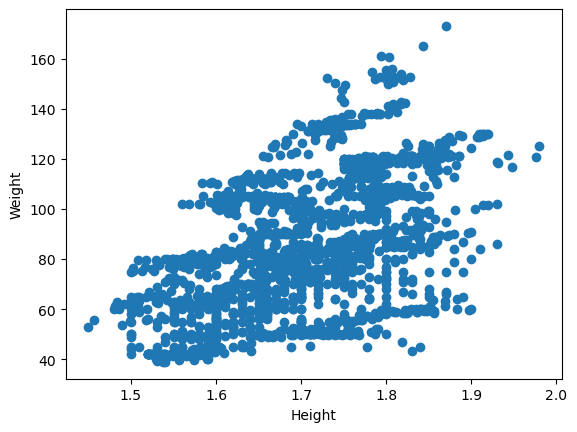

In [9]:
plt.scatter(df.Height, df.Weight )
plt.xlabel('Height')
plt.ylabel('Weight')
plt.show

In [10]:
df.Weight.max()

173.0

In [11]:
df.Height.max()

1.98

### 2) Top 10 Ages with Highest Weight

In [12]:
df.Weight.nlargest(10).values

array([173.      , 165.057269, 160.935351, 160.639405, 155.872093,
       155.242672, 154.618446, 153.959945, 153.149491, 152.720545])

In [13]:
indexs=df.Weight.nlargest(10).index

<function matplotlib.pyplot.show(close=None, block=None)>

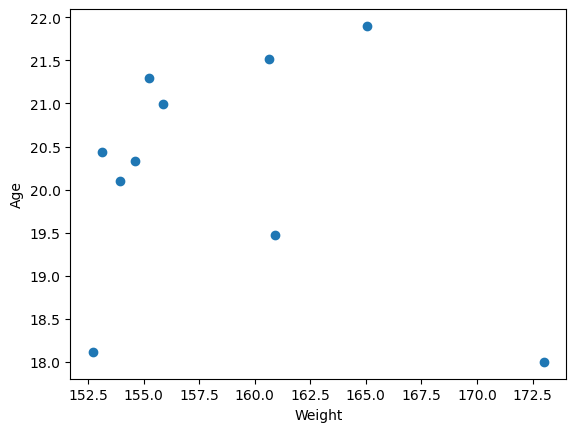

In [14]:
plt.scatter(df.Weight.nlargest(10).values, df.Age[indexs])
plt.xlabel('Weight')
plt.ylabel('Age')
plt.show

### 2.3) Distribution of CAEC values

<function matplotlib.pyplot.show(close=None, block=None)>

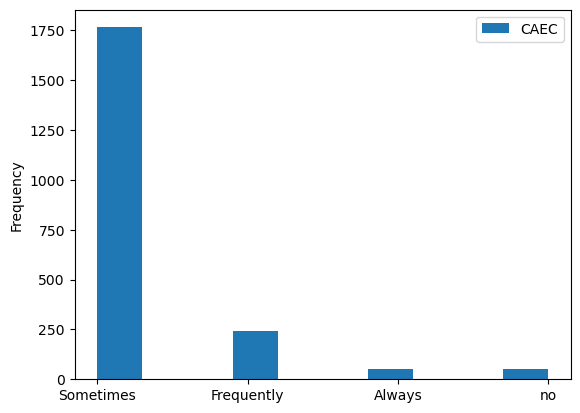

In [15]:
plt.hist(df.CAEC)
plt.legend(["CAEC"])
plt.ylabel('Frequency')
plt.show

### 2.4) Average Ages with Family History with Overweight

In [16]:
all_val=df[df['family_history_with_overweight']=='yes']

In [17]:
np.mean(all_val['Age'])

24.929042636732333

In [18]:
Avg_age_with_oversight=np.mean(df.Age) 
print(Avg_age_with_oversight
     )

24.312599908574136


### 2.5) Correlation matrix

In [19]:
df

,Age,Gender,Height,Weight,CALC,FAVC,FCVC,NCP,SCC,SMOKE,CH2O,family_history_with_overweight,FAF,TUE,CAEC,MTRANS,NObeyesdad
0,21.000000,Female,1.620000,64.000000,no,no,2.000000,3.000000,no,no,2.000000,yes,0.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
1,21.000000,Female,1.520000,56.000000,Sometimes,no,3.000000,3.000000,yes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,23.000000,Male,1.800000,77.000000,Frequently,no,2.000000,3.000000,no,no,2.000000,yes,2.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
3,27.000000,Male,1.800000,87.000000,Frequently,no,3.000000,3.000000,no,no,2.000000,no,2.000000,0.000000,Sometimes,Walking,Overweight_Level_I
4,22.000000,Male,1.780000,89.800000,Sometimes,no,2.000000,1.000000,no,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
5,29.000000,Male,1.620000,53.000000,Sometimes,yes,2.000000,3.000000,no,no,2.000000,no,0.000000,0.000000,Sometimes,Automobile,Normal_Weight
6,23.000000,Female,1.500000,55.000000,Sometimes,yes,3.000000,3.000000,no,no,2.000000,yes,1.000000,0.000000,Sometimes,Motorbike,Normal_Weight
7,22.000000,Male,1.640000,53.000000,Sometimes,no,2.000000,3.000000,no,no,2.000000,no,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
8,24.000000,Male,1.780000,64.000000,Frequently,yes,3.000000,3.000000,no,no,2.000000,yes,1.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
9,22.000000,Male,1.720000,68.000000,no,yes,2.000000,3.000000,no,no,2.000000,yes,1.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight


In [23]:
df.columns

Index(['Age', 'Gender', 'Height', 'Weight', 'CALC', 'FAVC', 'FCVC', 'NCP',
       'SCC', 'SMOKE', 'CH2O', 'family_history_with_overweight', 'FAF', 'TUE',
       'CAEC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [27]:
# hot_df=pd.get_dummies(df, columns=['Gender', 'CALC', 'FAVC',
#        'SCC', 'SMOKE', 'family_history_with_overweight',
#        'CAEC', 'MTRANS', 'NObeyesdad'])
corr_matrix=df[['Age','Height', 'Weight','FCVC','NCP', 'CH2O' , 'FAF', 'TUE' ]]
corr_matrix=corr_matrix.corr()

<function matplotlib.pyplot.show(close=None, block=None)>

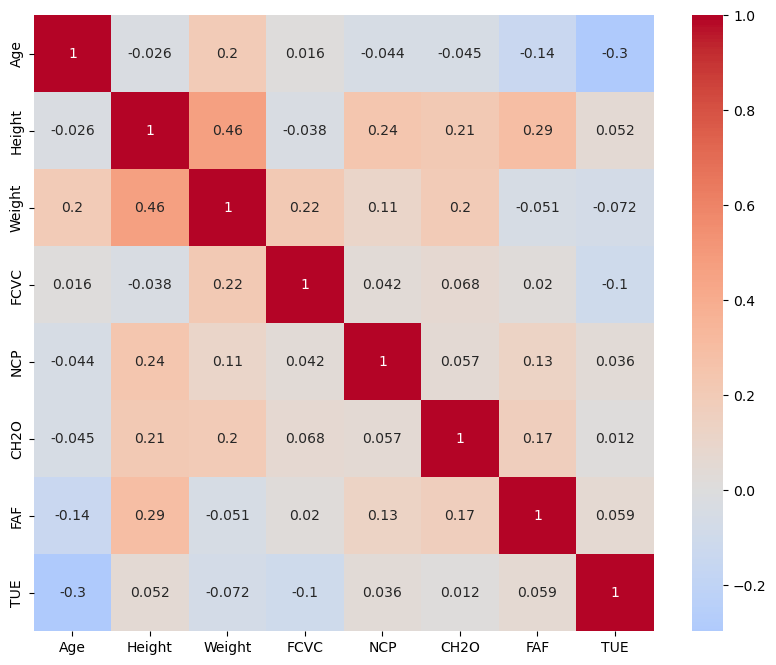

In [28]:
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.show

## STEP 3

In [29]:
df

,Age,Gender,Height,Weight,CALC,FAVC,FCVC,NCP,SCC,SMOKE,CH2O,family_history_with_overweight,FAF,TUE,CAEC,MTRANS,NObeyesdad
0,21.000000,Female,1.620000,64.000000,no,no,2.000000,3.000000,no,no,2.000000,yes,0.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
1,21.000000,Female,1.520000,56.000000,Sometimes,no,3.000000,3.000000,yes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,23.000000,Male,1.800000,77.000000,Frequently,no,2.000000,3.000000,no,no,2.000000,yes,2.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
3,27.000000,Male,1.800000,87.000000,Frequently,no,3.000000,3.000000,no,no,2.000000,no,2.000000,0.000000,Sometimes,Walking,Overweight_Level_I
4,22.000000,Male,1.780000,89.800000,Sometimes,no,2.000000,1.000000,no,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
5,29.000000,Male,1.620000,53.000000,Sometimes,yes,2.000000,3.000000,no,no,2.000000,no,0.000000,0.000000,Sometimes,Automobile,Normal_Weight
6,23.000000,Female,1.500000,55.000000,Sometimes,yes,3.000000,3.000000,no,no,2.000000,yes,1.000000,0.000000,Sometimes,Motorbike,Normal_Weight
7,22.000000,Male,1.640000,53.000000,Sometimes,no,2.000000,3.000000,no,no,2.000000,no,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
8,24.000000,Male,1.780000,64.000000,Frequently,yes,3.000000,3.000000,no,no,2.000000,yes,1.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight
9,22.000000,Male,1.720000,68.000000,no,yes,2.000000,3.000000,no,no,2.000000,yes,1.000000,1.000000,Sometimes,Public_Transportation,Normal_Weight


In [30]:
df=pd.get_dummies(df, columns=['Gender', 'FAVC', 'SCC', 'SMOKE',
                              'family_history_with_overweight', 'MTRANS'])

In [31]:
df

,Age,Height,Weight,CALC,FCVC,NCP,CH2O,FAF,TUE,CAEC,NObeyesdad,Gender_Female,Gender_Male,FAVC_no,FAVC_yes,SCC_no,SCC_yes,SMOKE_no,SMOKE_yes,family_history_with_overweight_no,family_history_with_overweight_yes,MTRANS_Automobile,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,21.000000,1.620000,64.000000,no,2.000000,3.000000,2.000000,0.000000,1.000000,Sometimes,Normal_Weight,True,False,True,False,True,False,True,False,False,True,False,False,False,True,False
1,21.000000,1.520000,56.000000,Sometimes,3.000000,3.000000,3.000000,3.000000,0.000000,Sometimes,Normal_Weight,True,False,True,False,False,True,False,True,False,True,False,False,False,True,False
2,23.000000,1.800000,77.000000,Frequently,2.000000,3.000000,2.000000,2.000000,1.000000,Sometimes,Normal_Weight,False,True,True,False,True,False,True,False,False,True,False,False,False,True,False
3,27.000000,1.800000,87.000000,Frequently,3.000000,3.000000,2.000000,2.000000,0.000000,Sometimes,Overweight_Level_I,False,True,True,False,True,False,True,False,True,False,False,False,False,False,True
4,22.000000,1.780000,89.800000,Sometimes,2.000000,1.000000,2.000000,0.000000,0.000000,Sometimes,Overweight_Level_II,False,True,True,False,True,False,True,False,True,False,False,False,False,True,False
5,29.000000,1.620000,53.000000,Sometimes,2.000000,3.000000,2.000000,0.000000,0.000000,Sometimes,Normal_Weight,False,True,False,True,True,False,True,False,True,False,True,False,False,False,False
6,23.000000,1.500000,55.000000,Sometimes,3.000000,3.000000,2.000000,1.000000,0.000000,Sometimes,Normal_Weight,True,False,False,True,True,False,True,False,False,True,False,False,True,False,False
7,22.000000,1.640000,53.000000,Sometimes,2.000000,3.000000,2.000000,3.000000,0.000000,Sometimes,Normal_Weight,False,True,True,False,True,False,True,False,True,False,False,False,False,True,False
8,24.000000,1.780000,64.000000,Frequently,3.000000,3.000000,2.000000,1.000000,1.000000,Sometimes,Normal_Weight,False,True,False,True,True,False,True,False,False,True,False,False,False,True,False
9,22.000000,1.720000,68.000000,no,2.000000,3.000000,2.000000,1.000000,1.000000,Sometimes,Normal_Weight,False,True,False,True,True,False,True,False,False,True,False,False,False,True,False


In [32]:
label_encoder=LabelEncoder()
for col in df.columns:
    if df[col].dtype == 'object':  # Check if the column is categorical
        df[col + '_Encoded'] = label_encoder.fit_transform(df[col])

# Drop the original categorical columns
df.drop(df.select_dtypes(['object']), axis=1, inplace=True)

In [33]:
df

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,Gender_Female,Gender_Male,FAVC_no,FAVC_yes,SCC_no,SCC_yes,SMOKE_no,SMOKE_yes,family_history_with_overweight_no,family_history_with_overweight_yes,MTRANS_Automobile,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking,CALC_Encoded,CAEC_Encoded,NObeyesdad_Encoded
0,21.000000,1.620000,64.000000,2.000000,3.000000,2.000000,0.000000,1.000000,True,False,True,False,True,False,True,False,False,True,False,False,False,True,False,3,2,1
1,21.000000,1.520000,56.000000,3.000000,3.000000,3.000000,3.000000,0.000000,True,False,True,False,False,True,False,True,False,True,False,False,False,True,False,2,2,1
2,23.000000,1.800000,77.000000,2.000000,3.000000,2.000000,2.000000,1.000000,False,True,True,False,True,False,True,False,False,True,False,False,False,True,False,1,2,1
3,27.000000,1.800000,87.000000,3.000000,3.000000,2.000000,2.000000,0.000000,False,True,True,False,True,False,True,False,True,False,False,False,False,False,True,1,2,5
4,22.000000,1.780000,89.800000,2.000000,1.000000,2.000000,0.000000,0.000000,False,True,True,False,True,False,True,False,True,False,False,False,False,True,False,2,2,6
5,29.000000,1.620000,53.000000,2.000000,3.000000,2.000000,0.000000,0.000000,False,True,False,True,True,False,True,False,True,False,True,False,False,False,False,2,2,1
6,23.000000,1.500000,55.000000,3.000000,3.000000,2.000000,1.000000,0.000000,True,False,False,True,True,False,True,False,False,True,False,False,True,False,False,2,2,1
7,22.000000,1.640000,53.000000,2.000000,3.000000,2.000000,3.000000,0.000000,False,True,True,False,True,False,True,False,True,False,False,False,False,True,False,2,2,1
8,24.000000,1.780000,64.000000,3.000000,3.000000,2.000000,1.000000,1.000000,False,True,False,True,True,False,True,False,False,True,False,False,False,True,False,1,2,1
9,22.000000,1.720000,68.000000,2.000000,3.000000,2.000000,1.000000,1.000000,False,True,False,True,True,False,True,False,False,True,False,False,False,True,False,3,2,1


In [35]:
x=df.drop('NObeyesdad_Encoded', axis=1)
y=df['NObeyesdad_Encoded']

In [37]:
x_train, x_test, y_train, y_test= train_test_split(x,y, test_size=0.2, random_state=42)

In [44]:
df.NObeyesdad_Encoded.unique()

array([1, 5, 6, 2, 0, 3, 4])

# Step 4 Algorithm

## Logistic Regression

In [52]:
model=LogisticRegression(max_iter=20000)

In [53]:
model.fit(x_train,y_train)

D:\conda_files_installed\envs\TensorFlow\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=20000)

In [58]:
y_pred=model.predict(x_test)

In [59]:
accuracy=accuracy_score(y_test, y_pred)

In [60]:
print(accuracy)

0.851063829787234


In [61]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.93      0.88        56
           1       0.81      0.61      0.70        62
           2       0.92      0.91      0.92        78
           3       0.91      1.00      0.95        58
           4       1.00      1.00      1.00        63
           5       0.69      0.75      0.72        56
           6       0.73      0.72      0.73        50

    accuracy                           0.85       423
   macro avg       0.84      0.85      0.84       423
weighted avg       0.85      0.85      0.85       423



## Linear Regression

In [63]:
model=LinearRegression()

In [64]:
model.fit(x_train, y_train)

LinearRegression()

In [65]:
y_pred=model.predict(x_test)

In [68]:
mse=mean_squared_error(y_test ,y_pred)
r2 = r2_score(y_test, y_pred)

In [69]:
print(mse)

2.758011969319777


In [70]:
print(r2)

0.25321371810243953


# Conclusion

Logistic regression Algo did well